In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from itertools import combinations
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random

import plotting_functions as pf

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
plate_palette = sns.color_palette("husl", n_colors=2)
sex_palette = ['hotpink','dodgerblue']
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


# QC plotting - 200 UMI merged adata

In [6]:
adata = sc.read("../IGVF_analysis/preprocessed_tissues/Liverpreprocessed.h5ad")


In [7]:
adata.layers['raw_counts'] = adata.X.copy()


In [8]:
adata

AnnData object with n_obs × n_vars = 3759220 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'B6J', 'NODJ', 'WSBJ', 'NZOJ', 'AJ', 'PWKJ', '129S1J', 'CASTJ', 'doublet_scores', 'batch'
    var: 'gene_name'
    layers: 'raw_counts'

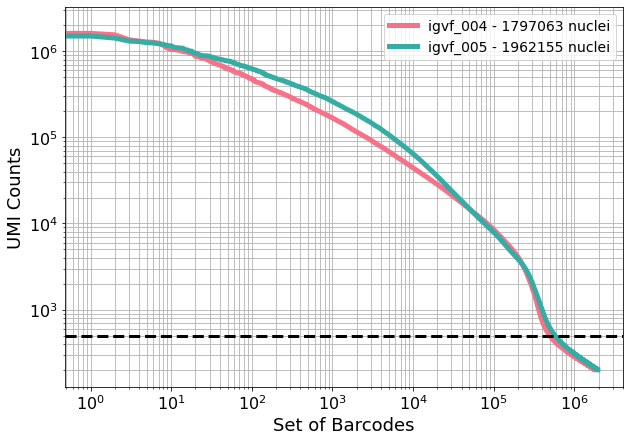

In [9]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

In [10]:
# set var names to be gene names, not gene ID
adata.var_names  = adata.var['gene_name']
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


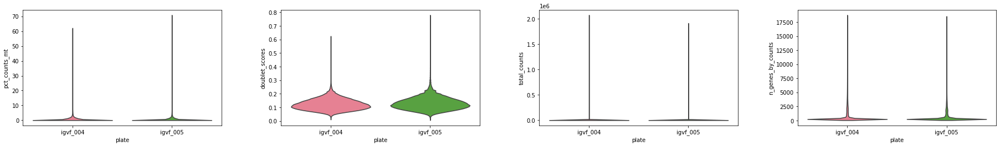

In [11]:
plate_palette = sns.color_palette("husl", n_colors=3)

sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

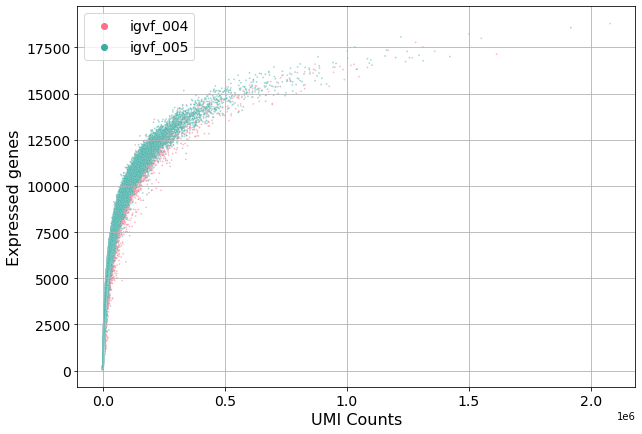

In [12]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

In [13]:
adatas = adata[(adata.obs['total_counts'] < 10000) & (adata.obs['n_genes_by_counts'] < 2000), :]


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


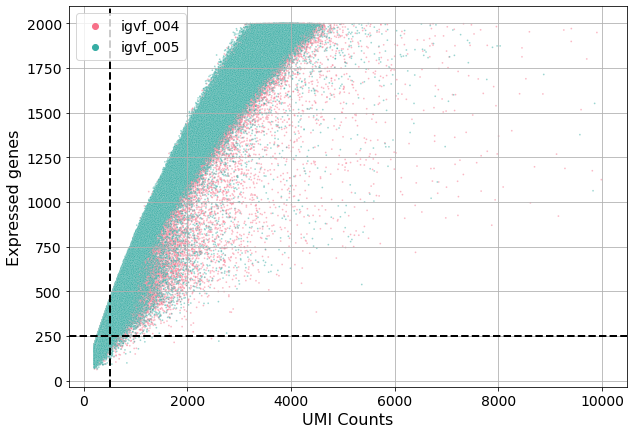

In [14]:
pf.plot_genes_by_counts(adatas, category_column='plate', figsize=(10, 7))

plt.axvline(x=500, color='k', linestyle='--', linewidth=2)
plt.axhline(y=250, color='k', linestyle='--', linewidth=2)

plt.show()

In [15]:
adatas[(adatas.obs['total_counts'] > 500) & (adatas.obs['n_genes_by_counts'] < 250), :]


View of AnnData object with n_obs × n_vars = 802 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'B6J', 'NODJ', 'WSBJ', 'NZOJ', 'AJ', 'PWKJ', '129S1J', 'CASTJ', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'raw_counts'

# QC plotting - filtered data
500 UMI, 250 genes, 1% mito, 0.25 doublet score


In [18]:
adata = sc.read("../IGVF_analysis/tissue_processed_500umi/Liver_processed.h5ad")


In [ ]:
print(adata.obs['Genotype'].value_counts())

adata = adata[adata.obs['Genotype'] != "tie",:]

print(adata.obs['Genotype'].value_counts())

In [19]:
adata.layers

Layers with keys: raw_counts

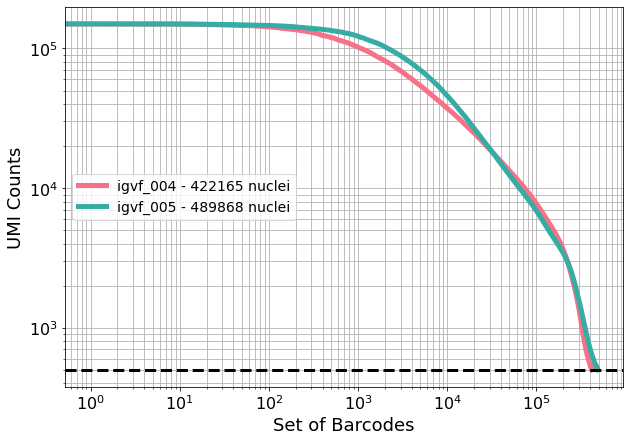

In [20]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

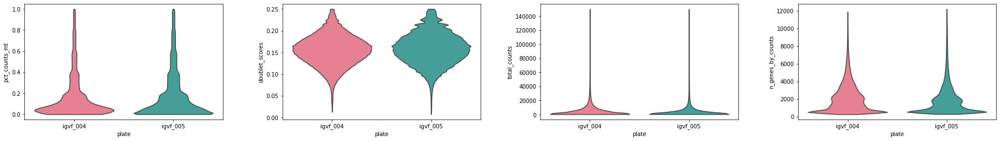

In [21]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

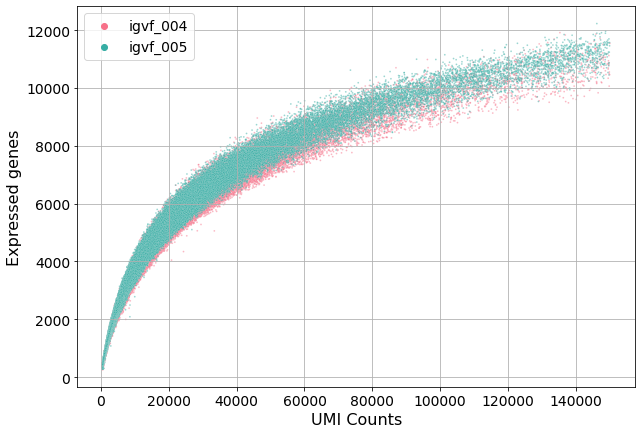

In [22]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

NZOJ      134340
NODJ      125950
129S1J    125595
PWKJ      121269
AJ        116714
B6J        97624
WSBJ       95092
CASTJ      94426
tie         1025
Name: Genotype, dtype: int64
NZOJ      134340
NODJ      125950
129S1J    125595
PWKJ      121269
AJ        116714
B6J        97624
WSBJ       95092
CASTJ      94426
Name: Genotype, dtype: int64


# Check clustering
Plate, sex, genotype

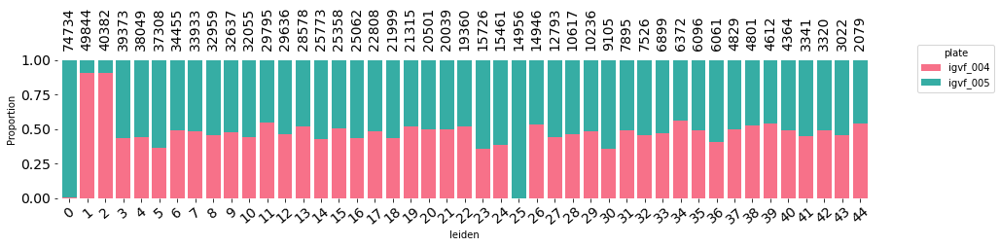

In [24]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)


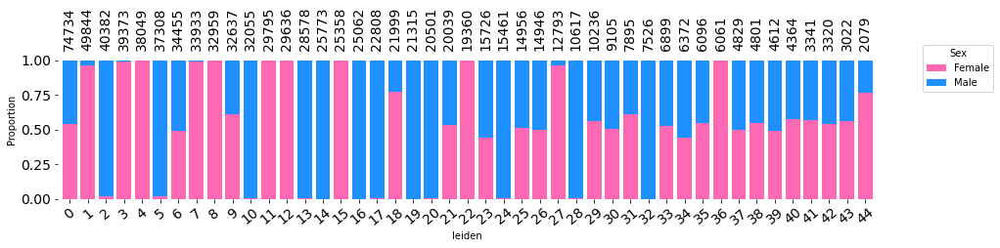

In [25]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Sex',
                            flip=False, fsize = (15,3), 
                            annotations = True)


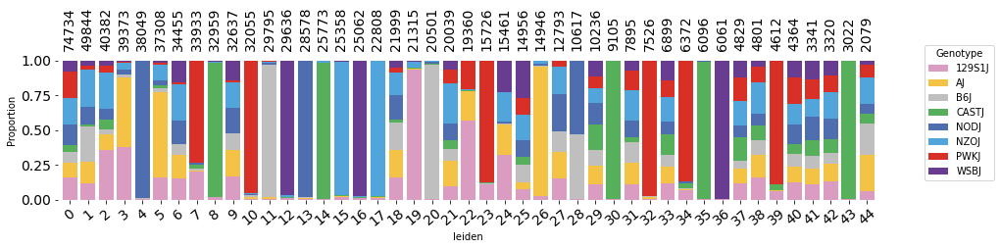

In [26]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/Users/liz/opt/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


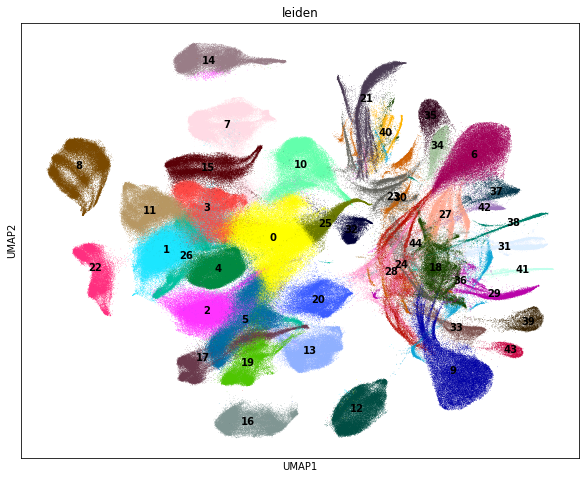

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


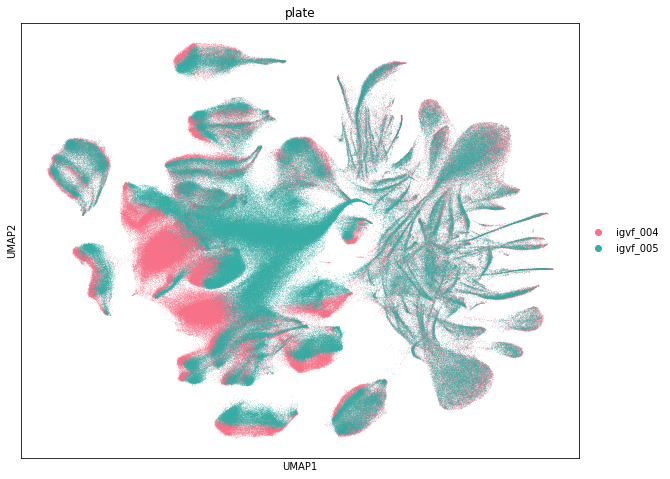

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


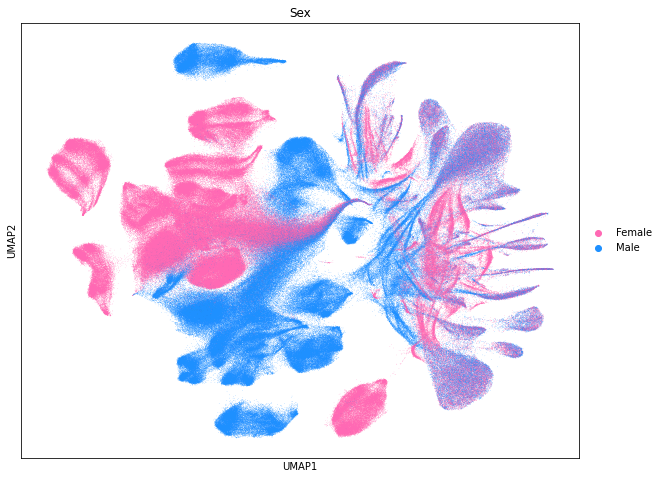

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


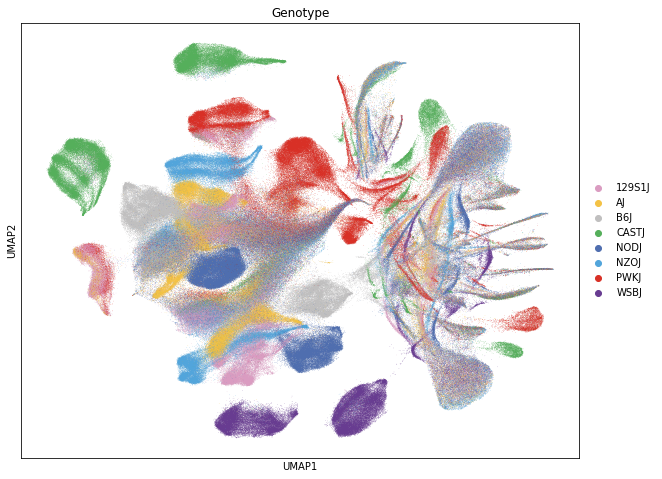

In [27]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Sex'], size = 0.8, palette = sex_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)



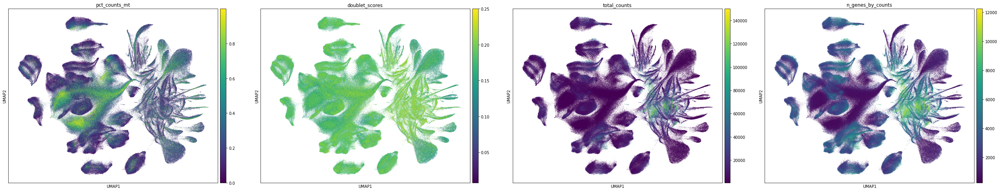

In [32]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'], size=1)



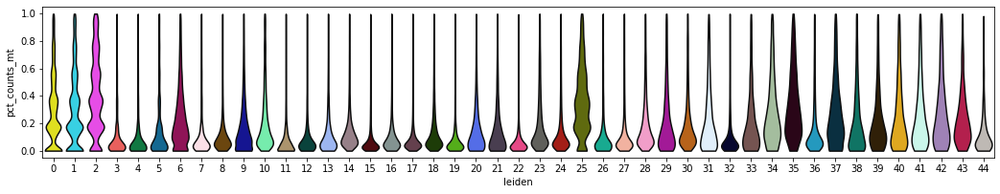

In [35]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['pct_counts_mt'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

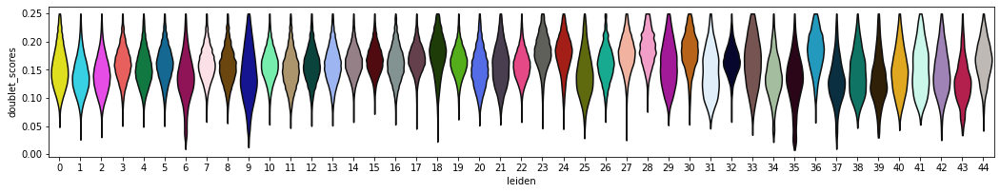

In [36]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['doublet_scores'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

categories: 0, 1, 2, etc.
var_group_labels: Hypo/pit


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


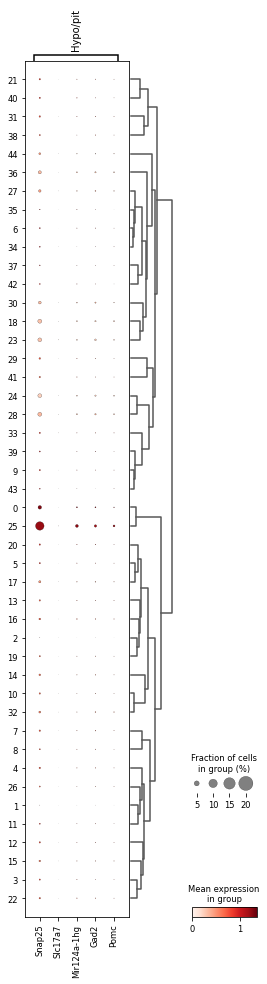

In [34]:
marker_genes_dict = {
    "Hypo/pit": ["Snap25","Slc17a7",'Mir124a-1hg', 'Gad2','Pomc'],
}

sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


# Remove large low-quality clusters and re-cluster

In [39]:
adata = adata[~adata.obs['leiden'].isin(["0","25"])]



In [40]:
adata

View of AnnData object with n_obs × n_vars = 821320 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'B6J', 'NODJ', 'WSBJ', 'NZOJ', 'AJ', 'PWKJ', '129S1J', 'CASTJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'

In [42]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

adatas = adata[:, adata.var.highly_variable]



/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:544: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


In [ ]:
sc.pp.regress_out(adatas, ['pct_counts_mt','n_genes_by_counts'])
sc.pp.scale(adatas, max_value=10)

sc.tl.pca(adatas, svd_solver='arpack', use_highly_variable = True)
sc.pp.neighbors(adatas, n_neighbors=20, n_pcs=30)

sc.tl.leiden(adatas, resolution = 1)


In [ ]:
sc.tl.umap(adatas, min_dist = 0.5, spread =2.0)


In [ ]:
adata.uns['neighbors'] = adatas.uns['neighbors']
adata.uns['leiden'] = adatas.uns['leiden']
adata.uns['umap'] = adatas.uns['umap']
adata.obs['leiden'] = adatas.obs['leiden']
adata.obsm = adatas.obsm
adata.obsp = adatas.obsp

In [ ]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Liver_filtered.h5ad')


In [4]:
adata = sc.read("../IGVF_analysis/annotated_tissues/Liver_filtered.h5ad")

In [9]:
adata

AnnData object with n_obs × n_vars = 821320 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'B6J', 'NODJ', 'WSBJ', 'NZOJ', 'AJ', 'PWKJ', '129S1J', 'CASTJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means

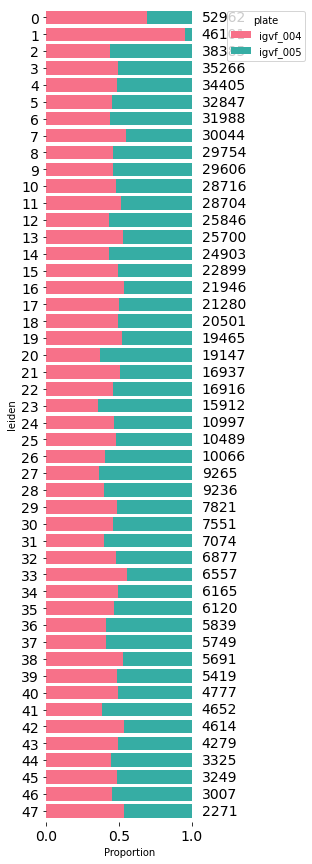

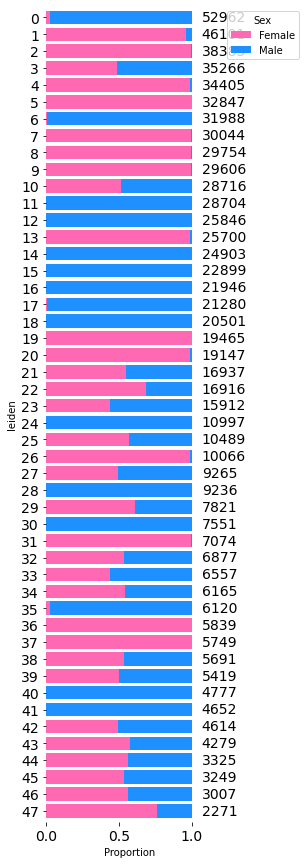

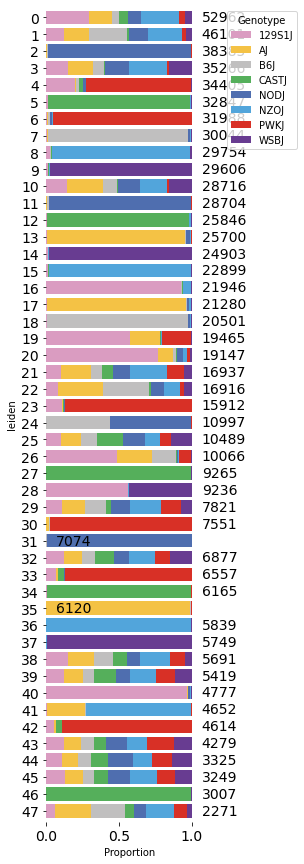

In [6]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=True, fsize = (3,15), 
                            annotations = True)

pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Sex',
                            flip=True, fsize = (3,15), 
                            annotations = True)

pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=True, fsize = (3,15), 
                            annotations = True)



In [21]:
# adjust mouse_tissue_id
# sample genotypes for each 'Multiplexed_sampleN'
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']


# Apply the function to update the 'Mouse_Tissue_ID' column
adata.obs['Mouse_Tissue_ID'] = adata.obs.apply(update_mouse_tissue_id, axis=1)

In [22]:
df = adata.obs[['Mouse_Tissue_ID','Estrus_cycle','plate']]
df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
df['Estrus_cycle'] = df['Estrus_cycle'].astype('str').replace('nan', 'NA')
df['Estrus_cycle'].value_counts()
adata.obs['Estrus_cycle'] = df['Estrus_cycle']


<ipython-input-22-2ec6448202e8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
<ipython-input-22-2ec6448202e8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
<ipython-input-22-2ec6448202e8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,c

In [33]:
count_samples = pd.DataFrame(adata.obs[['Mouse_Tissue_ID','leiden']])
cluster_percentages = df.groupby(['leiden', 'Mouse_Tissue_ID']).size() / df.groupby('leiden').size()
cluster_percentages[cluster_percentages > 0.5].reset_index()


,leiden,Mouse_Tissue_ID,0
0,19,038_129S1J_10F_05,0.560339
1,30,085_PWKJ_10M_05,0.967422
2,35,031_AJ_10M_05,0.957680
3,40,043_129S1J_10M_05,0.952690


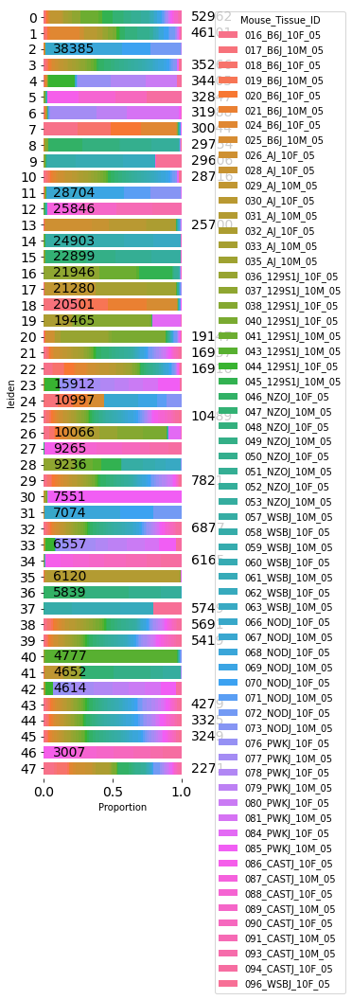

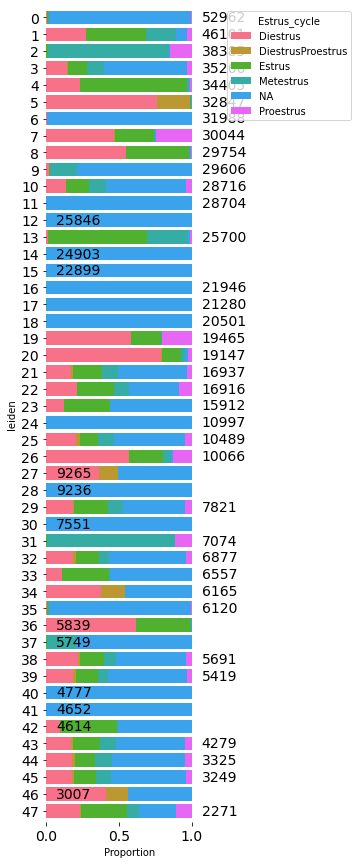

In [23]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Mouse_Tissue_ID',
                            flip=True, fsize = (3,15), 
                            annotations = True)



pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Estrus_cycle',
                            flip=True, fsize = (3,15), 
                            annotations = True)

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


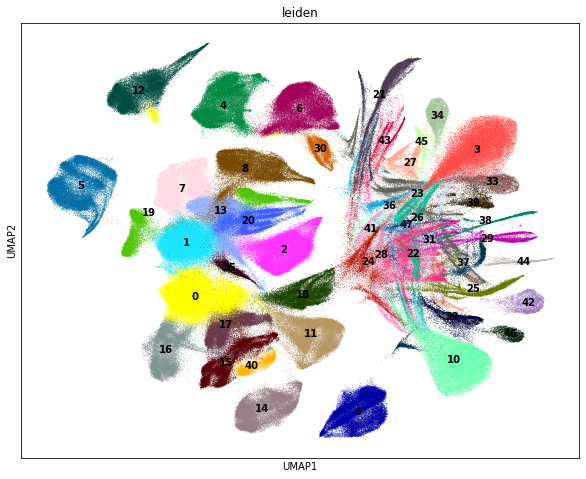

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


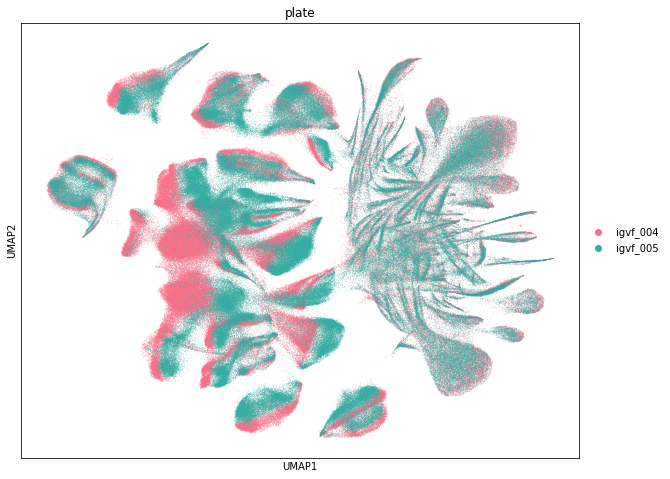

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


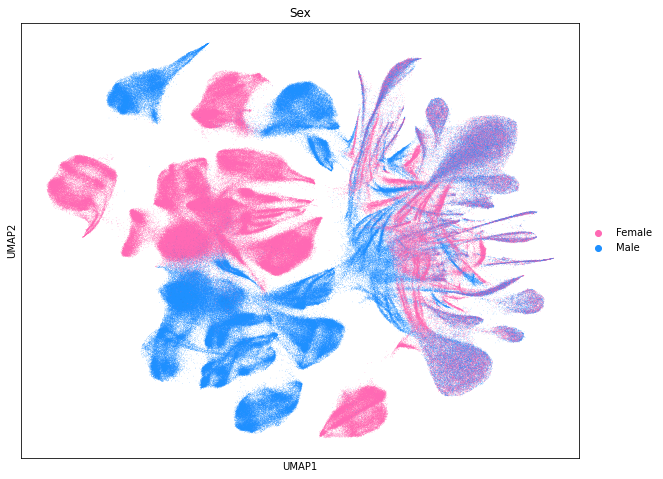

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


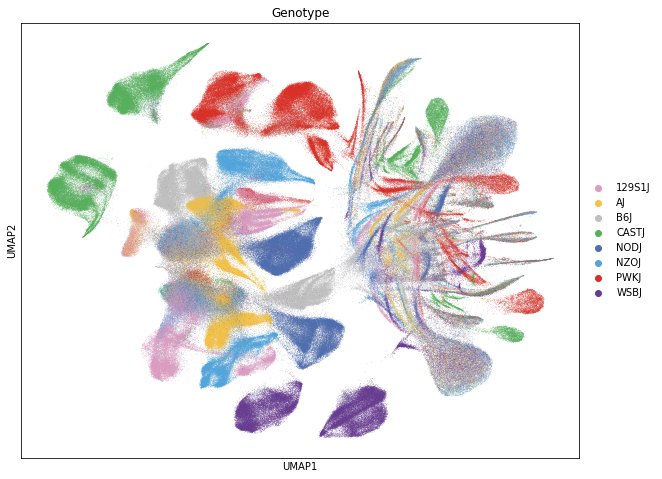

In [7]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Sex'], size = 0.8, palette = sex_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)



/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


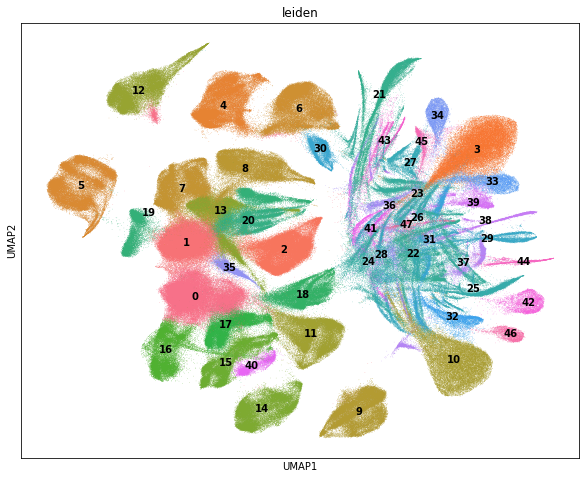

In [37]:
plt.rcParams['figure.figsize'] = (10, 8)


sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')#,palette=sns.color_palette("husl", n_colors=48))




/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


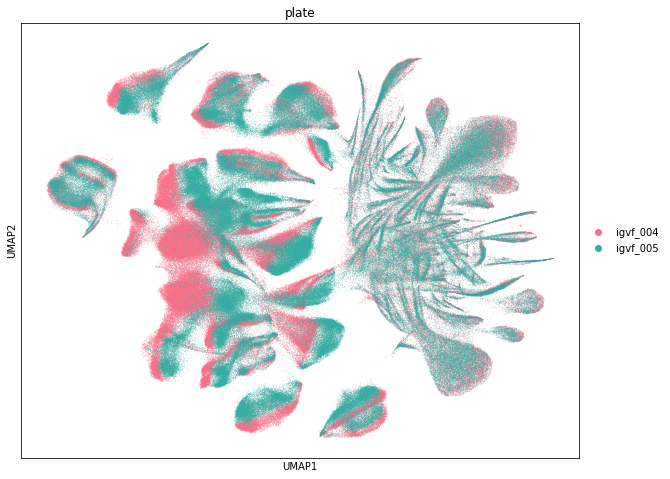

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


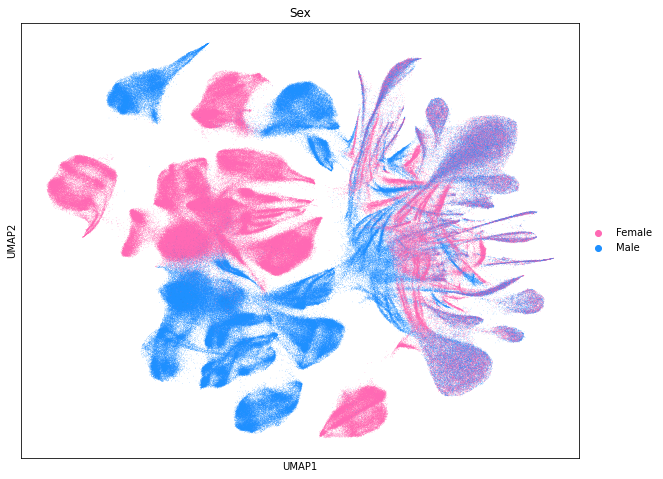

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


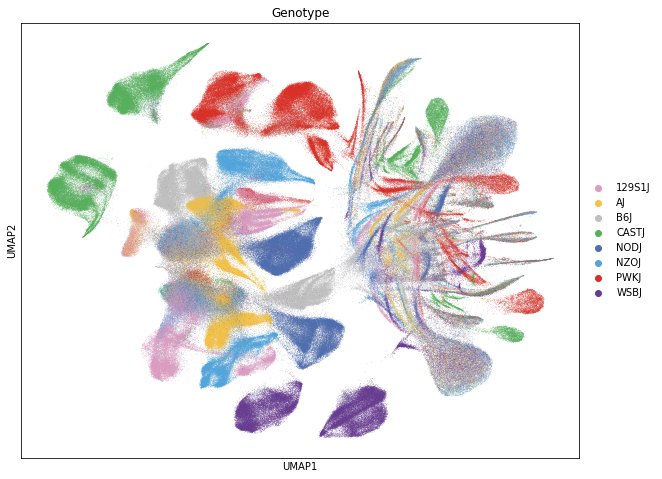

In [11]:
sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Sex'], size = 0.8, palette = sex_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)


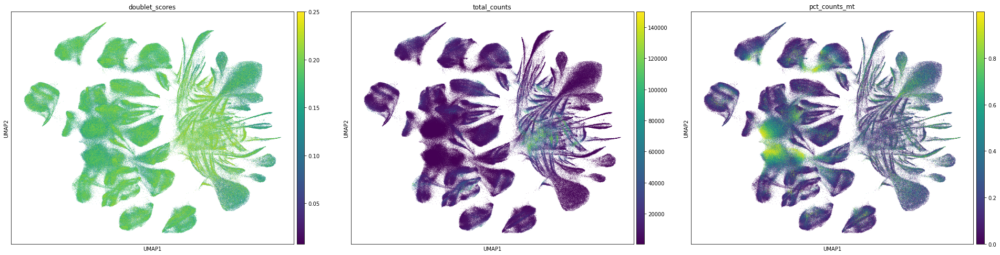

In [12]:
sc.pl.umap(adata, color=['doublet_scores','total_counts','pct_counts_mt'], size=1)


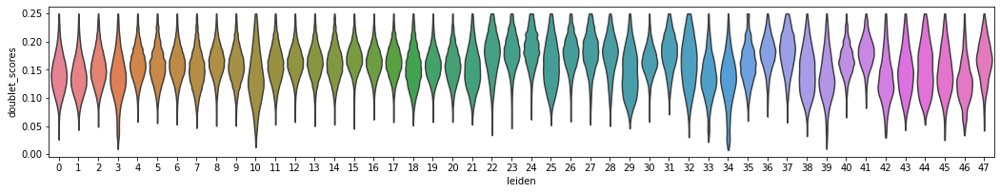

In [13]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['doublet_scores'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

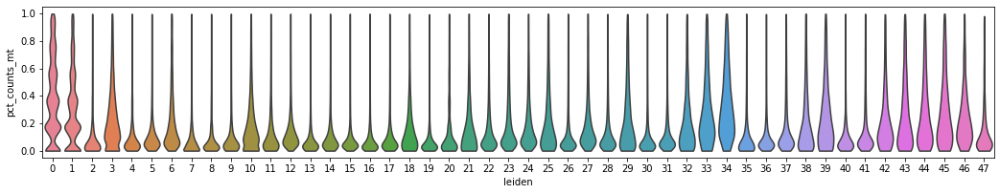

In [14]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['pct_counts_mt'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

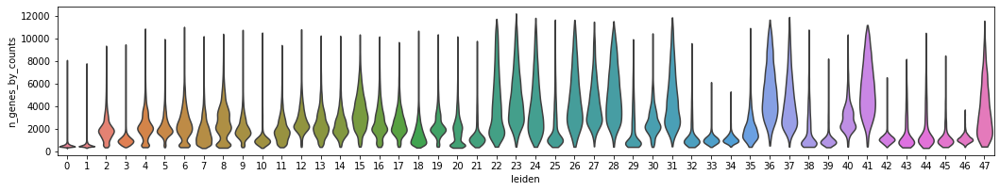

In [15]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['n_genes_by_counts'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

# Check marker gene expression
Live markers link: https://docs.google.com/spreadsheets/d/1RJHnxeobFfXAQdrUGAn4SWxQZzs0KaheuLJgNc6AjCg/edit#gid=0

In [3]:
adata = sc.read("../IGVF_analysis/annotated_tissues/Liver_filtered.h5ad")

In [6]:
adata.var_names  = adata.var['gene_name']


In [46]:
adata.raw = adata

In [53]:
my_markers_df = pd.read_csv("IGVF_curated_markers.csv")
my_markers_df = my_markers_df[my_markers_df['Gene'].isin(adata.var_names)]
my_markers_df = my_markers_df[my_markers_df['Tissue'] == 'Liver']

marker_genes_dict = my_markers_df.groupby('Subtype')['Gene'].agg(list).to_dict()

categories: 0, 1, 2, etc.
var_group_labels: B_cell, Cholangiocyte, Endothelial, etc.


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


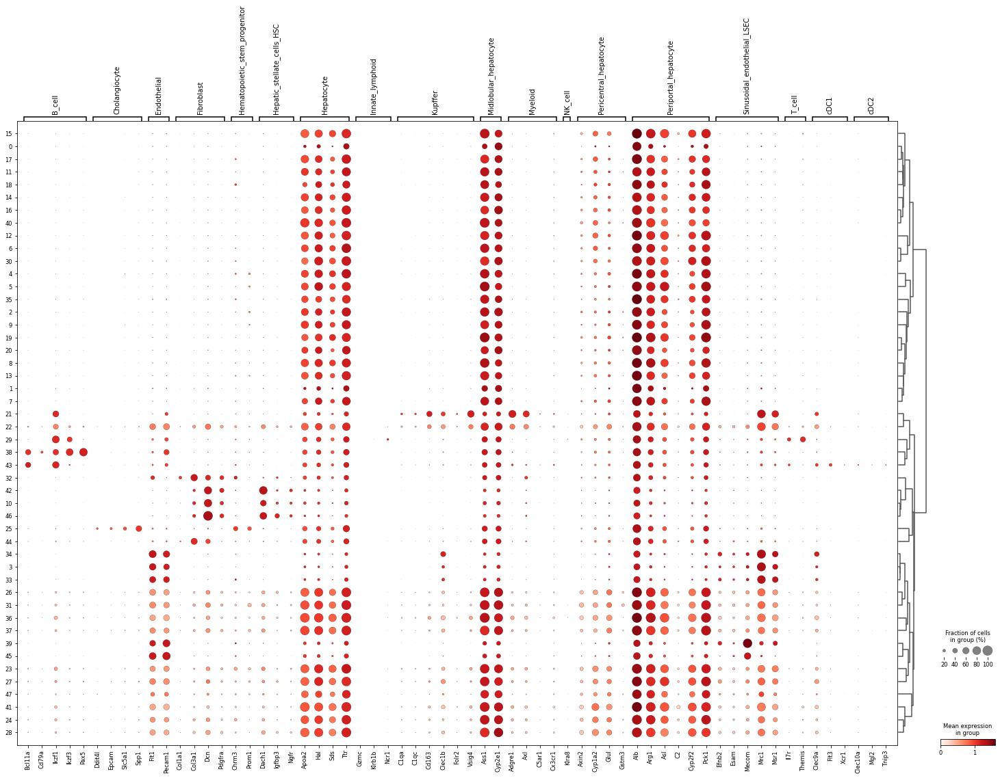

In [54]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


In [80]:
marker_genes_dict = {
    "Endothelial": ["Pecam1","Flt1","Flt4"],
    "Fibroblast": ["Dcn","Col3a1","Pdgfra","Wt1","Col1a1"],
    "B_cell": ["Bcl11a","Ikzf1","Ikzf3"],
    "T_cell": ["Il7r","Themis"],
    "Macrophage": ["Cd86","Csf1r","F13a1"],
    "Kupffer": ["C1qa","C1qc","Cd163","Clec1b","Folr2","Vsig4"],
    "Cholangiocyte": ["Ddit4l","Epcam","Slc5a1","Spp1",
                     'Sox9', 'Opn', 'Ck7', 'Ck19', 'Ck18', 
                      'Hnf1β', 'Hnf6', 'Sctr', 'Cftr', 'Asbt', 'Tgr5', 'Kdr'],
    "Hepatocyte": ["Alb","Arg1","Cyp2f2"]
}



categories: 0, 1, 2, etc.
var_group_labels: Endothelial, Fibroblast, B_cell, etc.


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


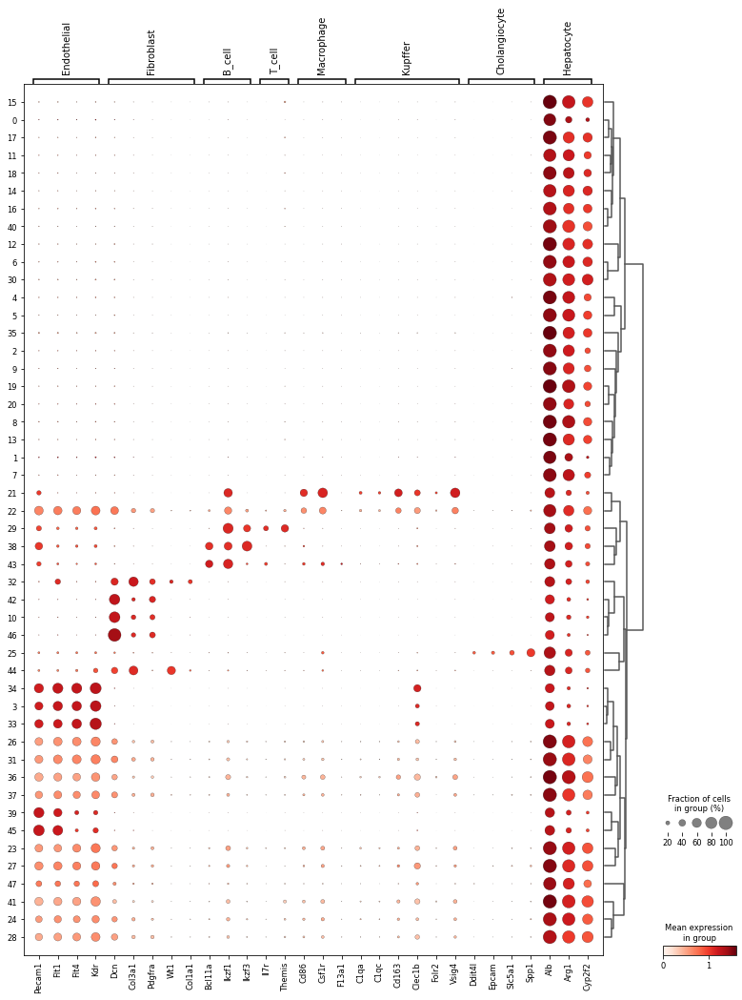

In [81]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


# Find cluster level markers


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWarning: DataFrame is highly 

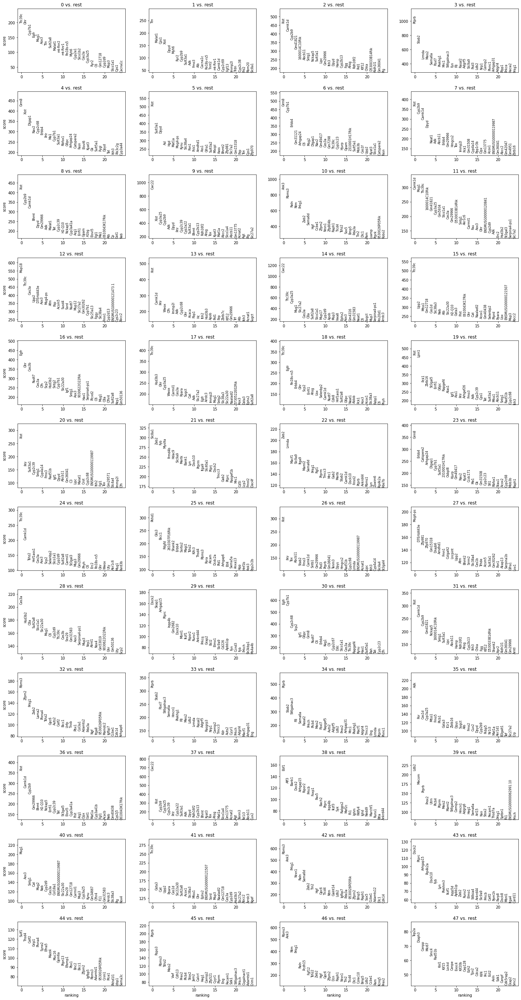

In [82]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [83]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
result = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})


In [84]:
result.to_csv("liver_cluster_markers.csv")

# Assign celltypes to clusters

In [85]:
annots = pd.read_csv("Liver_annotations.csv")
annots['leiden'] = annots['leiden'].astype(str)
annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['celltype'].to_dict()


In [86]:
adata.obs['celltype'] = adata.obs['leiden'].map(annotation_dict)

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


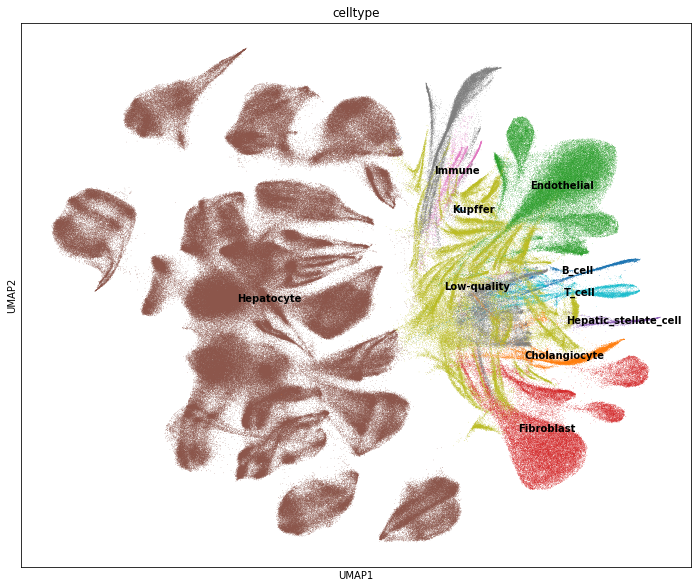

In [87]:
plt.rcParams['figure.figsize'] = (12, 10)

sc.pl.umap(adata, color=['celltype'], size=1, legend_loc = 'on data')


In [88]:
sc.tl.dendrogram(adata, groupby = 'celltype')

categories: B_cell, Cholangiocyte, Endothelial, etc.
var_group_labels: Endothelial, Fibroblast, B_cell, etc.


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


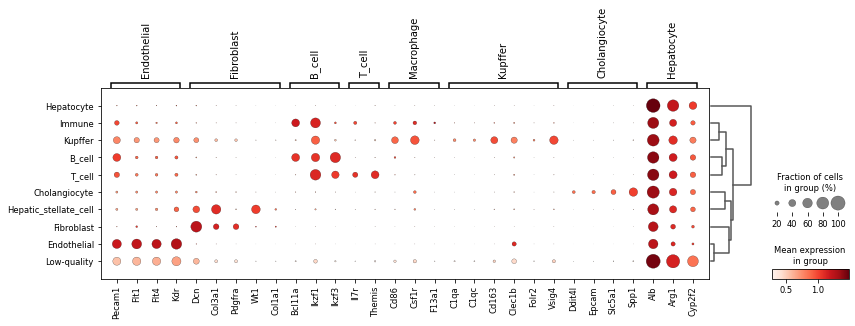

In [89]:
sc.pl.dotplot(adata, marker_genes_dict, 'celltype', mean_only_expressed = True,
              dendrogram=True, log=True)


# Sub-cluster non-hepatocytes 
Not super happy with their annotations. The number of low quality clusters are concerning.

In [11]:
adata_nonhep = adata[~adata.obs['leiden'].isin(["0","1","2","4","5","6","7","8","9","11","12","13","14","15","16","17","18","19","20","30","35","40"])]


In [12]:
adata_nonhep.write_h5ad('../IGVF_analysis/annotated_tissues/Liver_non_hepatocyte.h5ad')


In [3]:
adata_nonhep = sc.read('../IGVF_analysis/annotated_tissues/Liver_non_hepatocyte.h5ad')


In [ ]:
sc.pp.highly_variable_genes(adata_nonhep, min_mean=0.0125, max_mean=3, min_disp=0.5)

adatas_nonhep = adata_nonhep[:, adata_nonhep.var.highly_variable]

sc.pp.regress_out(adatas_nonhep, ['pct_counts_mt','n_genes_by_counts'])
sc.pp.scale(adatas_nonhep, max_value=10)

sc.tl.pca(adatas_nonhep, svd_solver='arpack', use_highly_variable = True)
sc.pp.neighbors(adatas_nonhep, n_neighbors=20, n_pcs=30)

sc.tl.leiden(adatas_nonhep, resolution = 1)

sc.tl.umap(adatas_nonhep, min_dist = 0.5, spread =2.0)


In [ ]:
adata_nonhep.uns['neighbors'] = adatas_nonhep.uns['neighbors']
adata_nonhep.uns['leiden'] = adatas_nonhep.uns['leiden']
adata_nonhep.uns['umap'] = adatas_nonhep.uns['umap']
adata_nonhep.obs['leiden'] = adatas_nonhep.obs['leiden']
adata_nonhep.obsm = adatas_nonhep.obsm
adata_nonhep.obsp = adatas_nonhep.obsp

adata_nonhep.write_h5ad('../IGVF_analysis/annotated_tissues/Liver_non_hepatocyte.h5ad')



In [3]:
adata_nonhep = sc.read('../IGVF_analysis/annotated_tissues/Liver_non_hepatocyte.h5ad')


# Save annotated adata

In [67]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Liver_annotated.h5ad')
